In [2]:
import datetime
import itertools
import math
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np
import os
import pdb
import sys
import xarray as xr
from tqdm import tqdm
from PIL import Image

sys.path.append('/home/quahb/caipi_denoising/src')

os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
os.environ['XLA_FLAGS'] = '--xla_gpu_cuda_data_dir=/home/quahb/.conda/pkgs/cuda-nvcc-12.1.105-0'
os.environ['TF_GPU_ALLOCATOR']='cuda_malloc_async'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow import keras
from modeling.DiffusionModel import build_model, DiffusionModel
from preparation.prepare_dataset import np_to_tfdataset
from preparation.data_io import load_dataset
from preparation.preprocessing_pipeline import fourier_transform, inverse_fourier_transform, low_pass_filter, rescale_magnitude
from utils.dct import dct2, idct2
from utils.GaussianDiffusion import GaussianDiffusion
from utils.vizualization_tools import plot2, plot4, plot_slices, plot_patches

%load_ext autoreload
%autoreload 2

# Hyperparams

In [3]:
slc_i = 130
load_epoch = 120

train_batch_size = 8
inference_batch_size = 16
num_epochs = 301  # add one so it trains one over ten
total_timesteps = 1000
norm_groups = 8  # Number of groups used in GroupNormalization layer
learning_rate = 2e-4
image_embedding = True

img_size = 384
img_channels = 1

first_conv_channels = 64
channel_multiplier = [1, 2, 4, 8]
widths = [first_conv_channels * mult for mult in channel_multiplier]
has_attention = [False, False, True, True]
num_res_blocks = 2  # Number of residual blocks

## 1. Load data

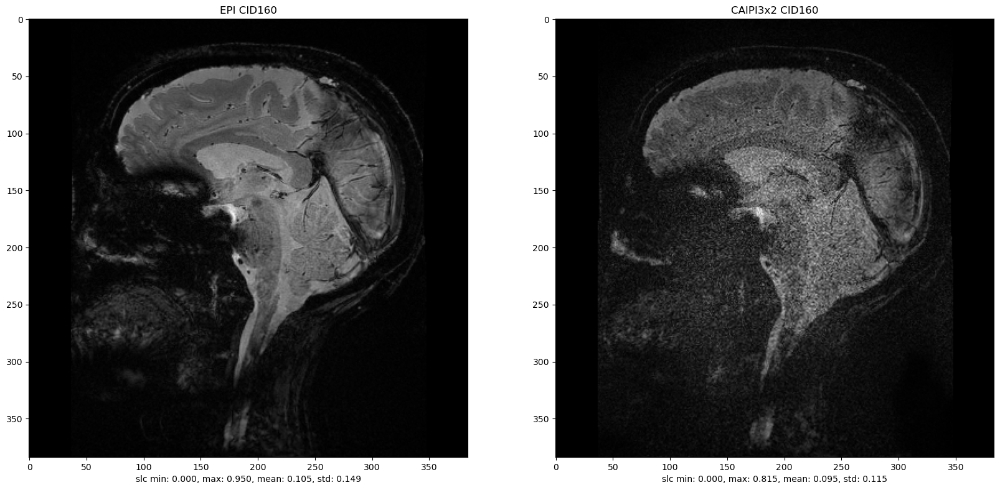

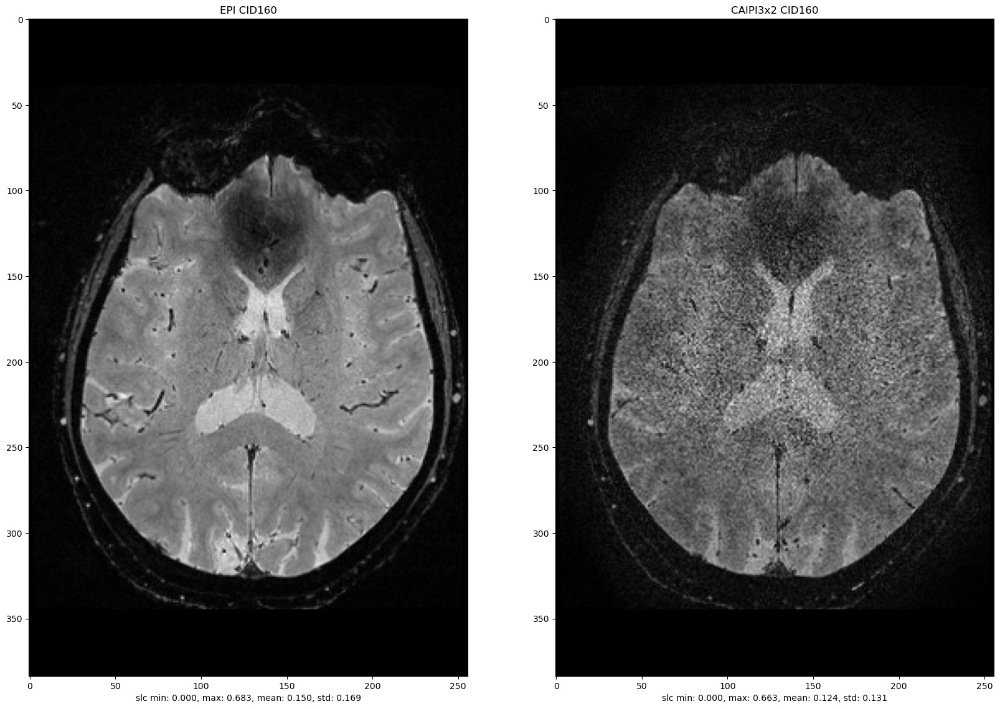

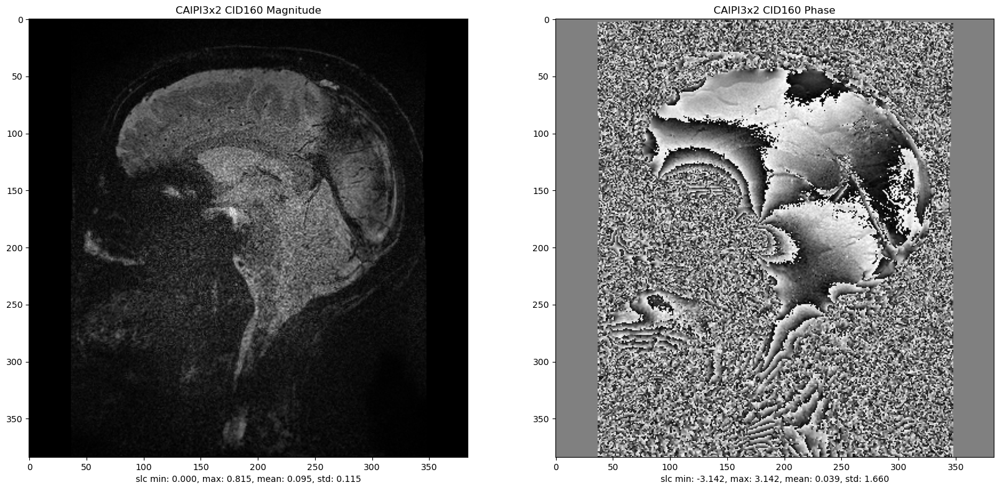

In [3]:
t2_star = np.array(nib.load('/home/quahb/caipi_denoising/data/niftis/msrebs/CID160/3D_T2STAR_segEPI.nii.gz').dataobj)
caipi   = np.array(nib.load('/home/quahb/caipi_denoising/data/datasets/accelerated/msrebs_compleximage/inputs/CID160_CAIPI3x2.nii.gz').dataobj)

t2_star = rescale_magnitude(t2_star)
t2_star = np.pad(
        t2_star,
        [(36, 36), (0,0), (0,0)],
        constant_values=0.0
)
t2_star = np.flip(np.moveaxis(t2_star, 0, 1), 0)
caipi = np.flip(np.moveaxis(caipi, 0, 1), 0)

mag_caipi, pha_caipi = np.abs(caipi), np.angle(caipi)

plot2(t2_star, np.abs(caipi), view='sagittal', slc_i=slc_i, title=['EPI CID160', 'CAIPI3x2 CID160'])
plot2(t2_star, np.abs(caipi), view='axial', slc_i=slc_i, title=['EPI CID160', 'CAIPI3x2 CID160'])
plot2(mag_caipi, pha_caipi, view='sagittal', slc_i=slc_i, title=['CAIPI3x2 CID160 Magnitude', 'CAIPI3x2 CID160 Phase'])

In [4]:
# slc_i=130

# ft_img = fourier_transform(caipi)

# lp_img128 = low_pass_filter(ft_img, window_size=128)
# ift_img128 = inverse_fourier_transform(lp_img128)

# lp_img192 = low_pass_filter(ft_img, window_size=192)
# ift_img192 = inverse_fourier_transform(lp_img192)

# #plot2(np.log(np.abs(lp_img75)), np.abs(caipi), view='sagittal')
# plot2(np.abs(np.log(lp_img128)), np.abs(ift_img128), view='sagittal', slc_i=slc_i, title=['128', '128'])
# plot2(np.abs(np.log(lp_img192)), np.abs(ift_img192), view='sagittal', slc_i=slc_i, title=['192', '192'])

## 2. Prepare Data

In [5]:
# none?

## 3. Build Denoiser

In [6]:
load_epoch = '120'
diffusion_model_name = f'diffusion_imgemb_models/diffusion_ep{load_epoch}.hd5'
ema_diffusion_model_name = f'diffusion_imgemb_models/ema_diffusion_ep{load_epoch}.hd5'

print(image_embedding)
# Build the unet model
gpus = ['/GPU:0', '/GPU:1', '/GPU:2', '/GPU:3']
strategy = tf.distribute.MirroredStrategy(devices=gpus)
with strategy.scope():
    network = build_model(
        img_size=img_size,
        img_channels=img_channels,
        widths=widths,
        has_attention=has_attention,
        num_res_blocks=num_res_blocks,
        norm_groups=norm_groups,
        activation_fn=keras.activations.swish,
        image_embedding=image_embedding,
    )
    ema_network = build_model(
        img_size=img_size,
        img_channels=img_channels,
        widths=widths,
        has_attention=has_attention,
        num_res_blocks=num_res_blocks,
        norm_groups=norm_groups,
        activation_fn=keras.activations.swish,
        image_embedding=image_embedding,
    )
    
    network.load_weights(diffusion_model_name)
    ema_network.load_weights(ema_diffusion_model_name)

    # Get an instance of the Gaussian Diffusion utilities
    gdf_util = GaussianDiffusion(timesteps=total_timesteps)

    # Get the model
    denoiser = DiffusionModel(
        network=network,
        ema_network=ema_network,
        gdf_util=gdf_util,
        timesteps=total_timesteps,
        image_embedding=image_embedding,
    )
    
    denoiser.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
    )

True
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


## 4. Run Denoising

15


denoising 15 times: 100%|███████████████████████████████████████████| 15/15 [03:52<00:00, 15.47s/it]


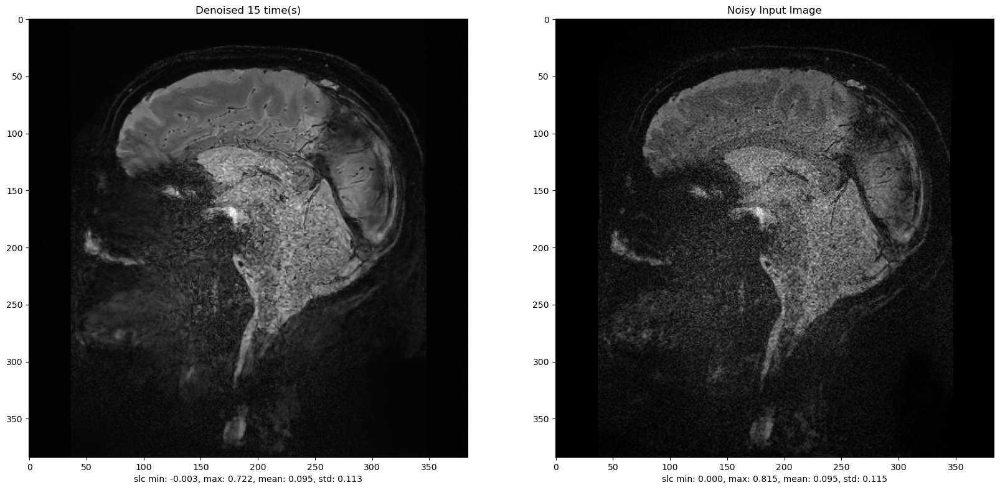

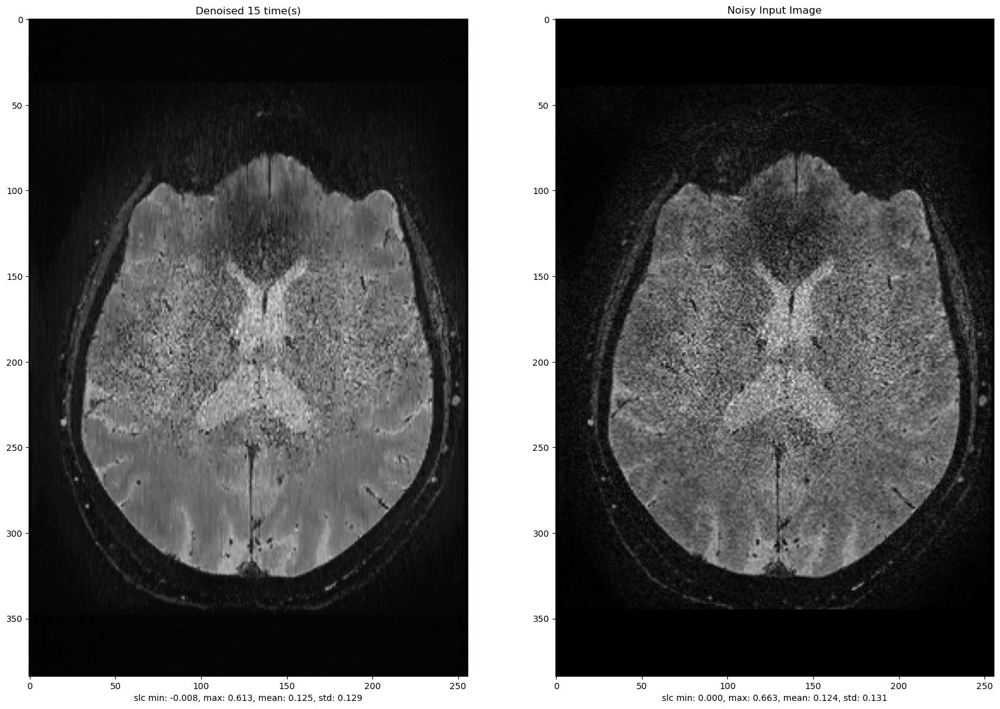

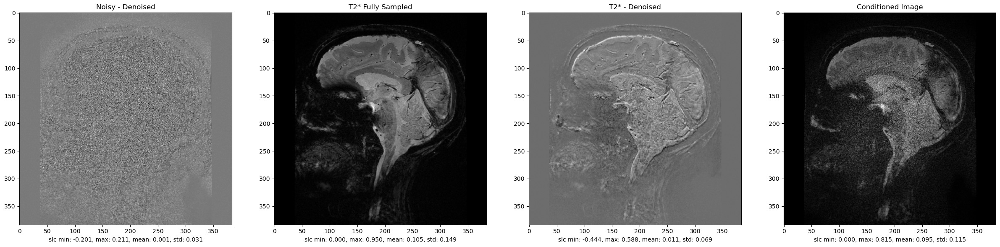

25


denoising 25 times: 100%|███████████████████████████████████████████| 25/25 [06:12<00:00, 14.90s/it]


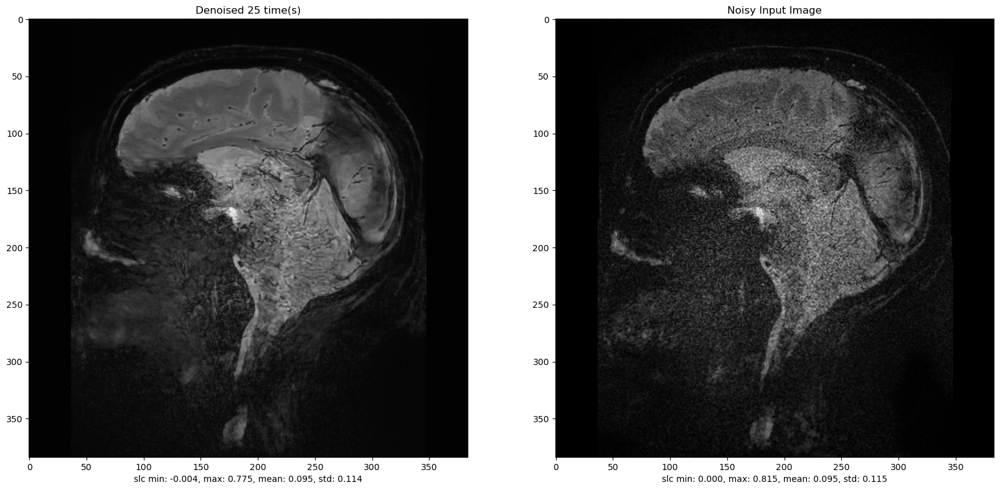

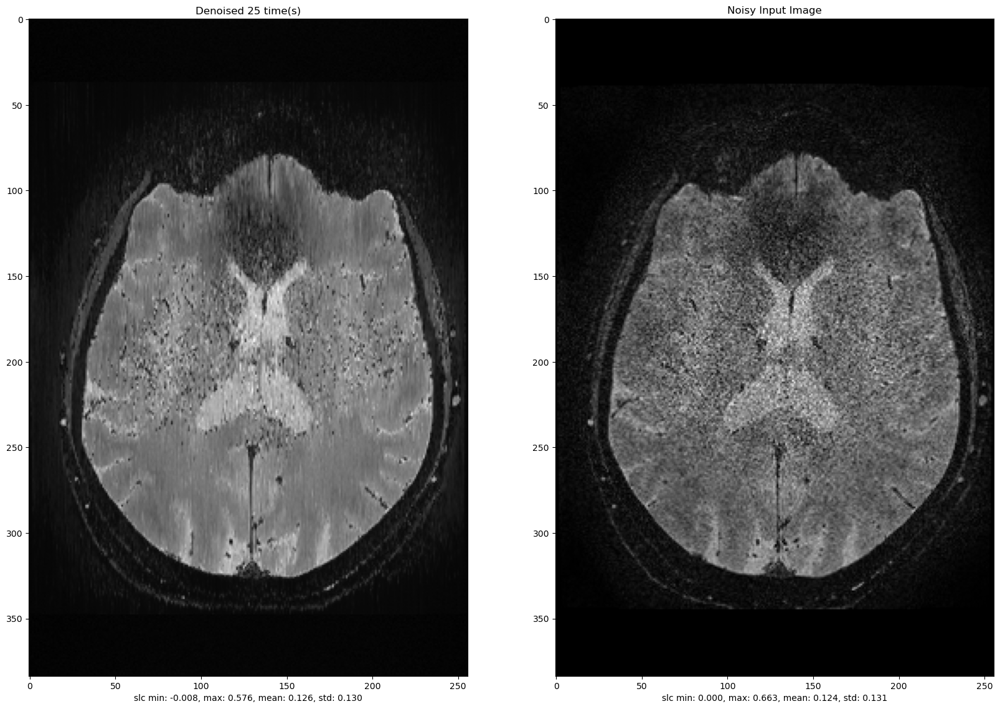

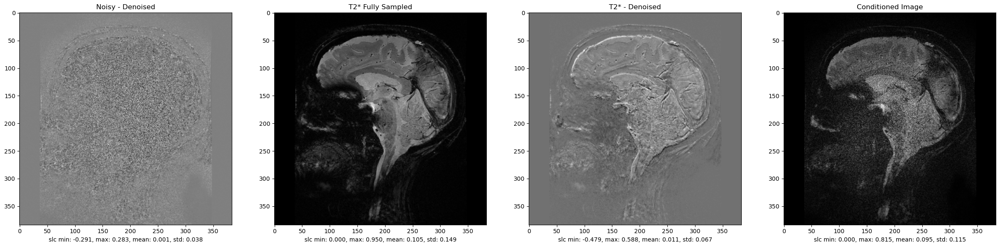

100


denoising 175 times: 100%|████████████████████████████████████████| 175/175 [43:53<00:00, 15.05s/it]


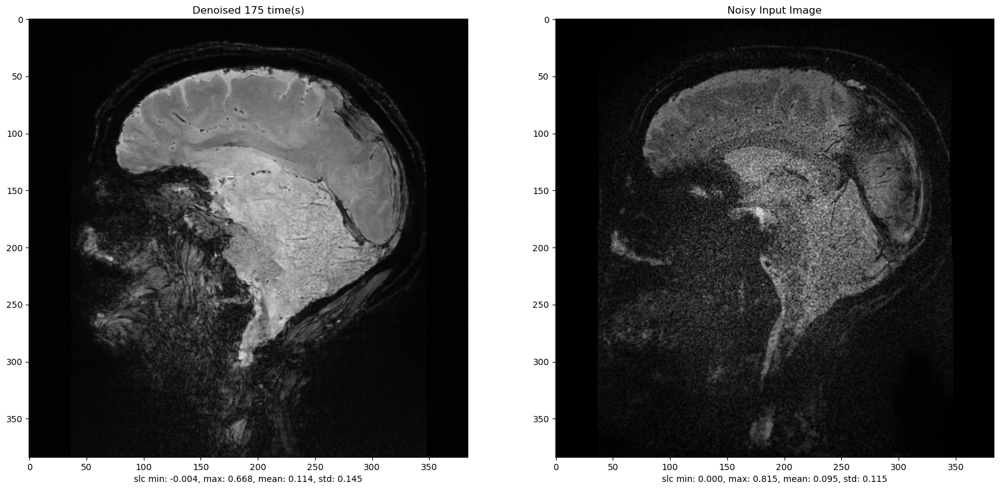

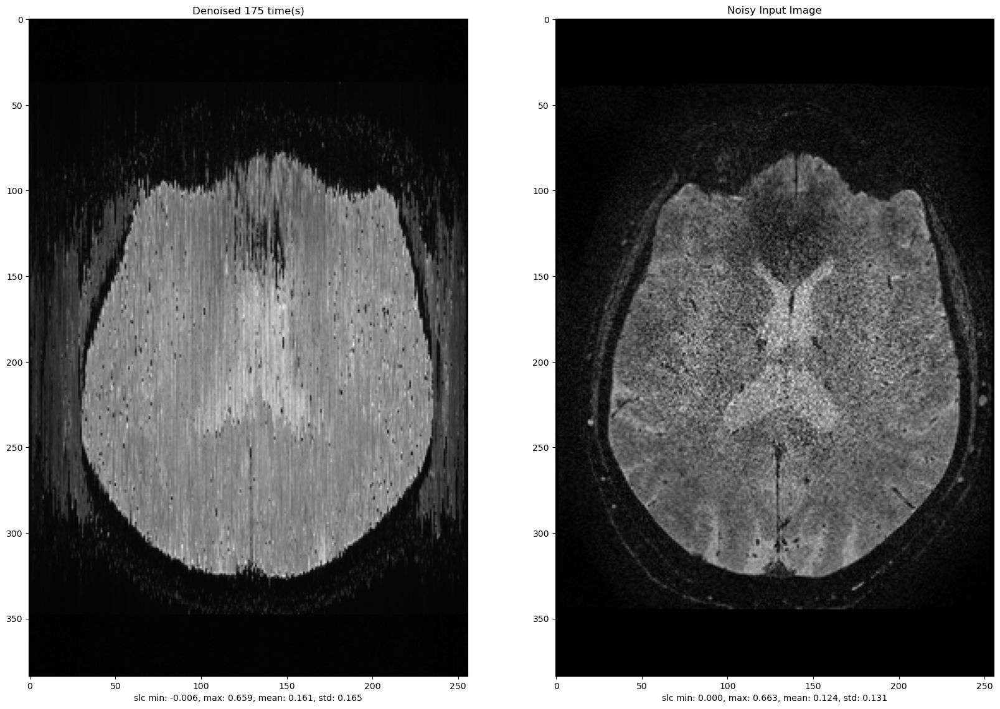

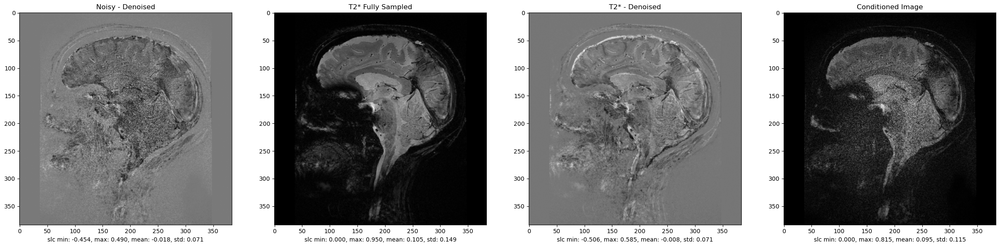

250


denoising 250 times: 100%|██████████████████████████████████████| 250/250 [1:02:19<00:00, 14.96s/it]


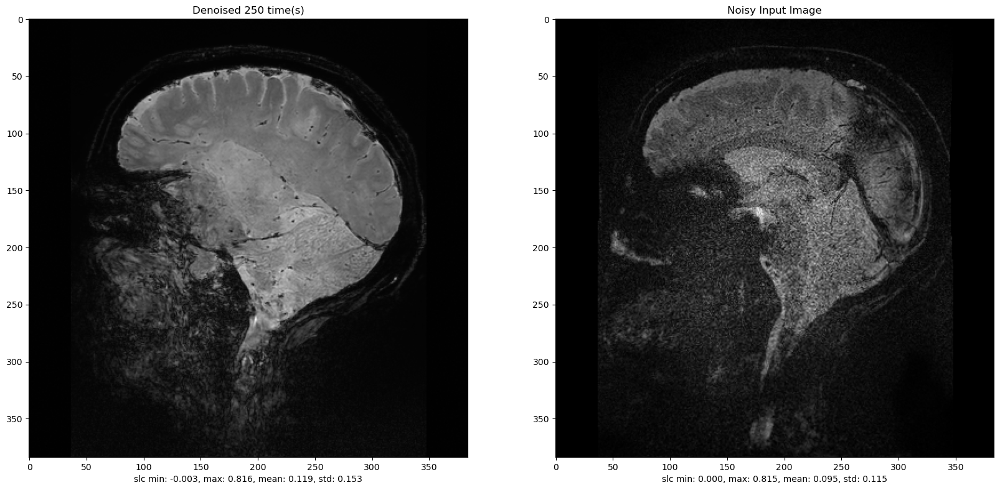

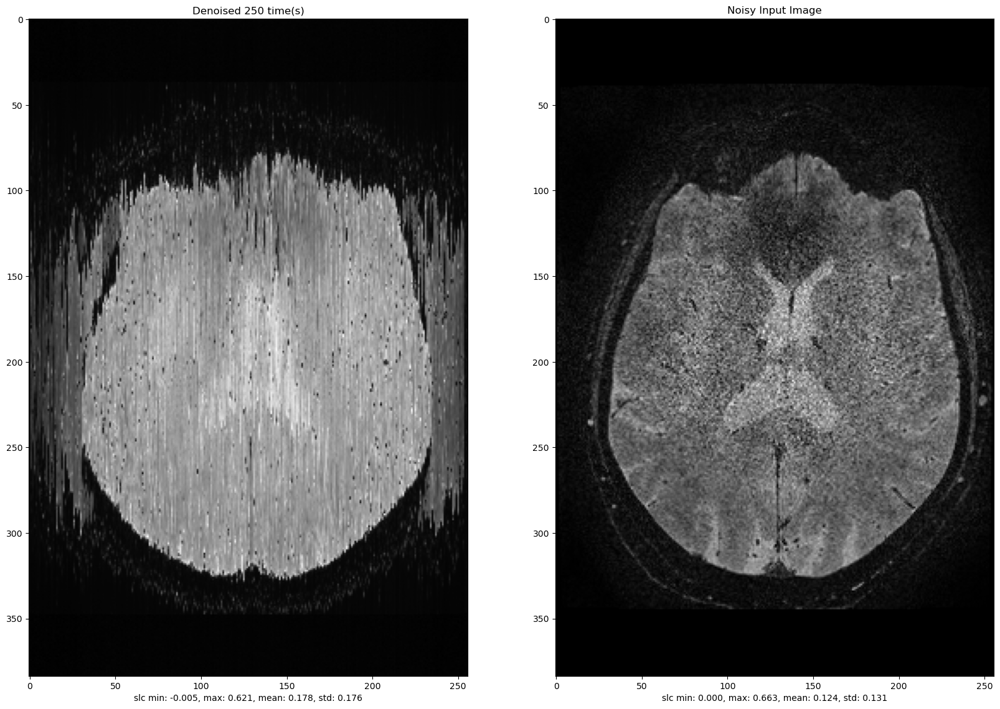

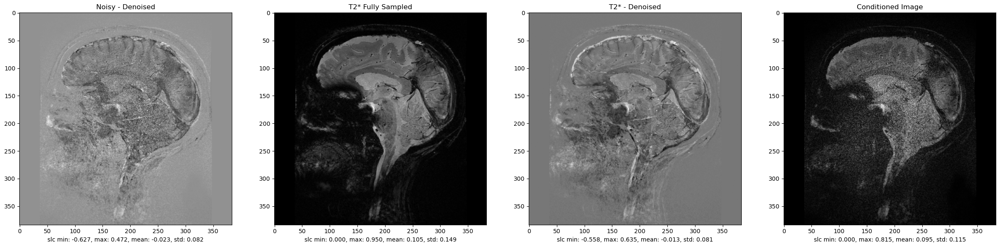

In [7]:
denoise_timesteps = [15,25, 100, 175, 250]
input_image = mag_caipi
reg_image = np.copy(input_image)

folder_path = '/home/quahb/caipi_denoising/data/datasets/accelerated/msrebs_magnitude/outputs'

for dt in denoise_timesteps:
    print(dt)

    denoised_image = denoiser.denoise_image(
        input_image, # (384, 384, 256)
        dt,
        regularization_image=reg_image,
    )

    plot2(denoised_image, mag_caipi,
          view='sagittal', 
          title=[f'Denoised {dt} time(s)', f'Noisy Input Image'],
          slc_i=slc_i
    )
    plot2(denoised_image, mag_caipi,
          view='axial', 
          title=[f'Denoised {dt} time(s)', f'Noisy Input Image'],
          slc_i=slc_i
    )
    # fully sampled - denoised calculate rmse
    plot4([mag_caipi - denoised_image, t2_star, t2_star - denoised_image, reg_image],
          view='sagittal',
          title=['Noisy - Denoised', f'T2* Fully Sampled', f'T2* - Denoised', f'Conditioned Image'],
          slc_i=slc_i
    )
    plt.show()

    file_name = os.path.join(folder_path, f'CID160_CAIPI3x2_Magnitude_DT{dt}')
    #np.save(os.path.join(folder_path, file_name), denoised_image)
    nii_image = nib.Nifti1Image(denoised_image, affine=np.eye(4))
    nib.save(nii_image, file_name + '.nii.gz')

In [ ]:
# plot images again for comparison
plot2(t2_star, mag_caipi, view='axial', title=['T2 Star EPI', 'CAIPI3x2'], slc_i=130)